This notebook involves the geospatial analysis of the locations of the author-members of Shakespare and Company. The intersection of author-members was determined in `01_intersection.ipynb`.

Necessary libraries are imported:

In [1]:
import matplotlib.pyplot as plt # for plotting
import seaborn as sns # for advanced plotting
import pandas as pd # for data manipulation
from pyproj import Transformer # for coordinate transformation
import geopandas as gpd # for geospatial data manipulation
import contextily as ctx # for basemaps
from shapely.geometry import box # for creating bounding boxes

The following code imports the `sort_names` function from `utils.py`, which is used to sort the names of the author-members in the dataset. The function is stored in a separate file to keep the notebook clean and readable as it is used across multiple notebooks.

In [2]:
from utils import sort_names # for sorting names

Now the `author_is_member` DataFrame created in the previous notebook (`01_intersection.ipynb`) is loaded. It includes the names of the author-members and corresponding information.

In [3]:
author_is_member = pd.read_csv('../data/processed/table-data/01_author_is_member.csv', encoding='utf-8')

In [4]:
author_is_member.columns

Index(['uri', 'name', 'sort_name', 'title', 'gender', 'is_organization',
       'has_card', 'birth_year', 'death_year', 'membership_years', 'viaf_url',
       'wikipedia_url', 'nationalities', 'addresses', 'postal_codes',
       'arrondissements', 'coordinates', 'notes', 'updated'],
      dtype='object')

## Geospatial Analysis

Now the geospatial analysis will be performed to identify the locations of the author-members and find geospatial patterns.

First, the `author_is_member` DataFrame is altered to extract coordinates and addresses of author-members.

In [5]:
# Explode the 'coordinates' and 'addresses' columns into separate Series
exploded_coordinates = author_is_member['coordinates'].str.split(';').explode()
exploded_addresses = author_is_member['addresses'].str.split(';').explode()

# Create a DataFrame from the exploded coordinates
# Each coordinate is expected in the format "latitude, longitude"
split_coordinate_components = exploded_coordinates.str.split(',', expand=True).apply(lambda col: col.str.strip())
split_coordinate_components.columns = ['latitude', 'longitude']

# Convert the coordinate strings to numeric values, coercing errors to NaN
split_coordinate_components['latitude'] = pd.to_numeric(split_coordinate_components['latitude'], errors='coerce')
split_coordinate_components['longitude'] = pd.to_numeric(split_coordinate_components['longitude'], errors='coerce')

# Compute the repetition counts for 'sort_name' based on the original index of author_is_member
repetition_counts = exploded_coordinates.groupby(level=0).size()
repeated_sort_names = author_is_member['sort_name'].repeat(repetition_counts)

# Attach the corresponding 'sort_name' and 'address' to the coordinates DataFrame
# Use .copy() here to ensure that modifications to coordinates_df do not affect split_coordinate_components
coordinates_df_initial = split_coordinate_components.copy()
coordinates_df_initial['sort_name'] = repeated_sort_names.values
coordinates_df_initial['address'] = exploded_addresses.values
coordinates_df = coordinates_df_initial.dropna()

# Display the resulting DataFrame
print(coordinates_df.tail(5))

    latitude  longitude         sort_name  \
80  48.84151    2.34177  Wilder, Thornton   
80  48.85459    2.33696  Wilder, Thornton   
81  48.85527    2.32557  Wilson, Margaret   
82  48.85074    2.33427     Wilson, Romer   
83  48.88504    2.26120   Wright, Richard   

                                             address  
80                      269 rue Saint-Jacques, Paris  
80            Hôtel du Maroc, 57 rue de Seine, Paris  
81                        4 boulevard Raspail, Paris  
82  Hôtel Récamier, 3 bis place Saint-Sulpice, Paris  
83   166 avenue Charles de Gaulle, Neuilly-sur-Seine  


For reusability purposes, the resulting `coordinates_df` DataFrame is saved to a CSV file.

In [6]:
# Export the DataFrame to CSV
coordinates_df.to_csv(
    '../data/processed/table-data/02_AM_locations_all.csv', # AM refers to 'Author-Member'
    index=False,
    encoding='utf-8'
)

### Mapping the Author-Member Locations (USA, Europe, Paris)

Based on `coordinates_df`, the locations of the author-members are mapped. The individual maps are centered around the USA, Europe, and Paris to visualize the distribution of author-members in these regions.

First, three functions are defined: (1) `ensure_crs()`, (2) `create_geodataframe()`, and (3) `plot_map()`.

The `ensure_crs()` function ensures that the coordinate reference system (CRS) is has the preferred setting for the GeoDataFrame.

In [7]:
def ensure_crs(gdf, crs_in="EPSG:4326", crs_out=None):
    """
    Ensures that the GeoDataFrame has a Coordinate Reference System (CRS) set.

    Parameters:
    gdf (GeoDataFrame): The GeoDataFrame to ensure CRS for.
    crs_in (str, optional): The CRS to set if the GeoDataFrame does not have one. Defaults to "EPSG:4326".
    crs_out (str, optional): The CRS to transform the GeoDataFrame to. If None, no transformation is applied. Defaults to None.

    Returns:
    GeoDataFrame: The GeoDataFrame with the ensured and/or transformed CRS.
    """
    if gdf.crs is None:
        gdf.set_crs(crs_in, inplace=True)
    if crs_out:
        gdf = gdf.to_crs(crs_out)
    return gdf

The `create_geodataframe()` function creates a GeoDataFrame from the input DataFrame. The difference between a DataFrame and a GeoDataFrame is that the latter contains a geometry column that stores the spatial information.

In [8]:
def create_geodataframe(df, lon_col='longitude', lat_col='latitude', crs_in="EPSG:4326", crs_out="EPSG:3857"):
    """
    Converts a DataFrame with longitude and latitude columns into a GeoDataFrame with specified coordinate reference systems.

    Parameters:
    df (pandas.DataFrame): The input DataFrame containing longitude and latitude columns.
    lon_col (str): The name of the column containing longitude values. Default is 'longitude'.
    lat_col (str): The name of the column containing latitude values. Default is 'latitude'.
    crs_in (str): The coordinate reference system of the input data. Default is "EPSG:4326".
    crs_out (str): The coordinate reference system to convert the GeoDataFrame to. Default is "EPSG:3857".

    Returns:
    gpd.GeoDataFrame: A GeoDataFrame with the specified output coordinate reference system.
    """
    gdf = gpd.GeoDataFrame(
        df,
        geometry=gpd.points_from_xy(df[lon_col], df[lat_col]),
        crs=crs_in
    )
    return gdf.to_crs(crs_out)

The `plot_map()` function plots the GeoDataFrame on a map.

In [9]:
def plot_map(gdf, world_map, bounds, title='Map', zoom=14, name_col=None, map_name='name'):
    
    """ Plots a map with the given GeoDataFrame and world map.

    Parameters:
    gdf (GeoDataFrame): GeoDataFrame containing the points to plot.
    world_map (GeoDataFrame): GeoDataFrame containing the world map for background.
    bounds (tuple): Tuple containing the bounds of the map (minx, miny, maxx, maxy).
    title (str, optional): Title of the map. Default is 'Map'.
    zoom (int, optional): Zoom level for the basemap. Default is 14.
    name_col (str, optional): Column name in gdf to use for coloring points by unique values. Default is None.

    Returns:
    None """
   
    minx, miny, maxx, maxy = bounds
    # Create a color palette if name_col is provided
    if name_col:
        unique_names = gdf[name_col].unique()
        palette = sns.color_palette("Set1", len(unique_names))
        name_to_color = {name: color for name, color in zip(unique_names, palette)}
    # Plotting
    fig, ax = plt.subplots(figsize=(25,14))
    world_map.plot(ax=ax, edgecolor='darkgray', linewidth=0.5, alpha=0)
    # Plot points with different colors if name_col is provided
    if name_col:
        for name, color in name_to_color.items():
            subset = gdf[gdf[name_col] == name]
            subset.plot(
                ax=ax,
                marker='o',
                color=[color],
                markersize=90,
                edgecolor='black',
                label=name
            )
    else:
        gdf.plot(ax=ax, marker='o', color='red', markersize=45, edgecolor='black')
    # Set limits for the axes
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)
    # Add title and labels
    ax.set_title(title, fontsize=16, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    # Add grid
    ax.grid(True, linestyle='--', linewidth=0.5)
    # Add legend if name_col is provided
    if name_col:
        ax.legend(
            title='Author-members with the same address',
            loc='upper left',
            bbox_to_anchor=(1, 1),
            fancybox=True,
            title_fontproperties={'weight': 'bold'},
            labelspacing=1.5
        )
    # Add basemap
    ctx.add_basemap(
        ax,
        crs=gdf.crs.to_string(),
        source=ctx.providers.CartoDB.Voyager,
        zoom=zoom,
        interpolation='sinc'
    )

    plt.savefig(f'../data/processed/figure-images/02_map_AM_{map_name}.png') # AM refers to 'Author-Member'

    plt.show()

To map the author-members' locations, a shapefile of the world map is required. The shapefile derives from https://www.kaggle.com/datasets/venkatkumar001/geographical-data/data and contains the geometries of the countries.

Additionally, the shapefile is reprojected to EPSG:3857 to match the basemap projection that follows.

In [10]:
# Load the world map and reproject it to EPSG:3857
raw_world_map = gpd.read_file('../data/raw/world.shp')
world_map_3857 = ensure_crs(raw_world_map, crs_out="EPSG:3857")

# Create a GeoDataFrame from the coordinates DataFrame and reproject it to EPSG:3857
raw_coords_gdf = create_geodataframe(coordinates_df)
coords_gdf_3857 = raw_coords_gdf.to_crs(epsg=3857)

# Remove rows with empty geometries
valid_coords_gdf = coords_gdf_3857[~coords_gdf_3857.geometry.is_empty]

Now, a buffer distance is incorporated to the `valid_coords_gdf` GeoDataFrame. The buffer distance is set to 480km to ensure that the points are visible on the map. Not using a buffer distance would lead to the points being too close to the edges of the map.

In [11]:
# Define the buffer distance in meters
buffer_distance = 480000

# Create a buffered GeoDataFrame without modifying the original
buffered_coords_gdf = valid_coords_gdf.assign(
    geometry=valid_coords_gdf.geometry.buffer(buffer_distance)
)

# Extract the total bounds from the buffered GeoDataFrame
buffered_bounds = buffered_coords_gdf.total_bounds
min_x, min_y, max_x, max_y = buffered_bounds

The next step is to plot the map of the author-members' locations based on `world_map_3857` (reprojected world map) and `valid_coords_gdf` (geolocations of author-members). Red points represent the author-members' locations.

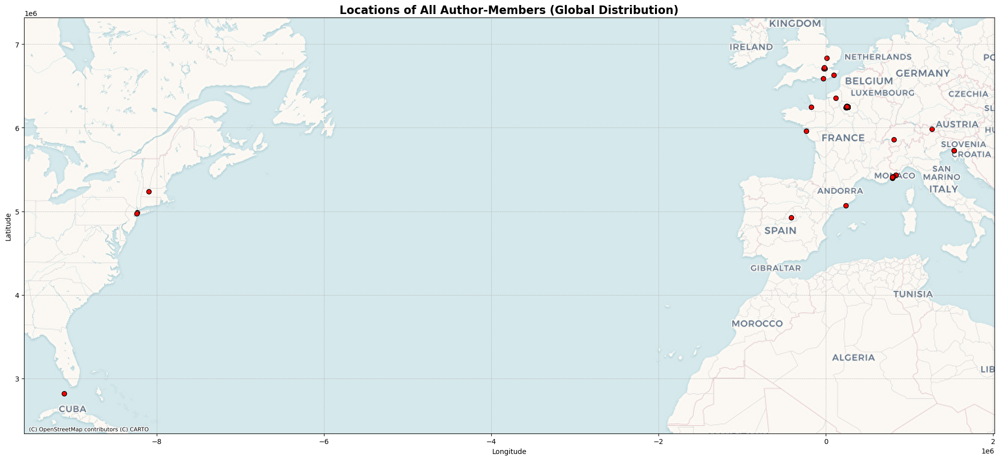

In [12]:
# Plot the map using the GeoDataFrame and the reprojected world map
plot_map(valid_coords_gdf, world_map_3857, (min_x, min_y, max_x, max_y),
         'Locations of All Author-Members (Global Distribution)', 4, map_name='locations_all')

Before the author-members' locations are plotted in a zoomed-in mode, three functions are defined: (1) `transform_bounds()`, (2) `extract_and_group_by_city()`, and (3) `unique_names_by_region()`.

The following function `transform_bounds()` transforms the coordinates of the given bounds using a predefined CRS (Coordinate Reference System). The function is used to set the bounds of the map and is thus similar to the buffer distance that was previously added to `valid_coords_gdf`.

In [13]:
# Create a Transformer instance only once
transformer = Transformer.from_crs("epsg:4326", "epsg:3857", always_xy=True)

def transform_bounds(bounds):
    """
    Transforms the coordinates of the given bounds using a predefined transformer.

    Args:
        bounds (tuple): A tuple containing two tuples, each with two float elements representing coordinates 
                        (e.g., ((x1, y1), (x2, y2))).

    Returns:
        tuple: A tuple containing two transformed coordinate tuples.
    """
    return transformer.transform(bounds[0][0], bounds[0][1]), transformer.transform(bounds[1][0], bounds[1][1])

The function `extract_and_group_by_city()` extracts and groups names, coordinates, and addresses of the author-members by city. The function is used to group the author-members by city for further analysis.

In [14]:
def extract_and_group_by_city(gdf, bounds, region_name="Region"):
    """
    Extracts and groups names, coordinates, and addresses of individuals within a specified bounding box by city.

    Parameters:
    - gdf (GeoDataFrame): A GeoDataFrame containing the data.
    - bounds (tuple): A tuple of the form ((minx, miny), (maxx, maxy)) defining the bounding box.
    - region_name (str): A name for the region (e.g., "USA", "Europe").

    Returns:
    - grouped_data (DataFrame): A DataFrame grouped by city with author-members' names and aggregated coordinates.
    """
    # Create the bounding box
    (minx, miny), (maxx, maxy) = bounds
    bbox = box(minx, miny, maxx, maxy)
    
    # Filter the GeoDataFrame for individuals within the bounding box
    region_gdf = gdf[gdf.within(bbox)][['sort_name', 'latitude', 'longitude', 'address']]
    
    # Extract city names more robustly
    def extract_city(address):
        if ',' in address:
            return address.split(',')[-1].strip()  # Take the last part after a comma
        return address.strip()  # If no comma, assume the whole address is the city
    
    region_gdf['city'] = region_gdf['address'].apply(extract_city)
    
    # Deduplicate names and group by city
    grouped_data = region_gdf.groupby('city').agg({
        'sort_name': lambda x: sort_names(list(set(x))),  # Deduplicate names and format
    }).reset_index()
    
    return grouped_data

The `unique_names_by_region()` function extracts unique names of the author-members by region.

In [15]:
def unique_names_by_region(grouped):
    """
    Generates and prints a list of unique names by region from a grouped DataFrame.
    This function expects the input DataFrame to have at least one column named 'sort_name',
    where each row can contain one or more names, separated by commas. These names are split,
    combined, and deduplicated to produce the final list of unique author-members.
    Parameters:
        grouped (pd.DataFrame): The grouped DataFrame containing a 'sort_name' column.
    Prints:
        - The list of unique author-members.
        - The total number of unique author-members.
    """
# Split the rows in the 'sort_name' column by commas
    groupe_count = grouped['sort_name'].str.split(', ')

# Flatten the list of lists into a single list
    all_names = [name for sublist in groupe_count for name in sublist]

# Get the unique names from the list
    unique_array = pd.Series(all_names).unique()

    print(f"List of author-members: {unique_array}")

    print(f"Total number of unique author-members: {len(unique_array)}")

After the three functions are defined, the next step is to define the bounds for the following maps: USA, Europe, and Paris (one including suburbs and the other containing only the center). The bounds are used to set the extent of the maps and derive from the Klokan Technologies bboxfinder tool: https://web.archive.org/web/20250111104940/https://boundingbox.klokantech.com/.

In [16]:
# Define bounding box coordinates for USA, Europe and Paris
usa_west_bounds = [(-83.75,22.29), (-68.28,44.35)]
europe_bounds = [(-6.38,38.49), (15.53,55.2)]
paris_bounds = [(2.180085,48.766403), (2.480307,48.939056)]
paris_central_bounds = [(2.26392,48.832317), (2.366459,48.873431)]

The bounding box coordinates are then transformed using the `transform_bounds()` function. They need to be transformed as the coordinates are inherently in the WGS 84 (EPSG:4326) format, and the maps were previously transformed into the Mercator projection (EPSG:3857). The EPSG:3857 projection was chosen as it leads to a more accurate representation of the world map.

In [17]:
# Transform the bounds for both regions
usa_bounds_3857 = transform_bounds(usa_west_bounds)
europe_bounds_3857 = transform_bounds(europe_bounds)
paris_bounds_3857 = transform_bounds(paris_bounds)
paris_central_bounds_3857 = transform_bounds(paris_central_bounds)

After these preparations, the author-member locations are plotted, starting with the USA.

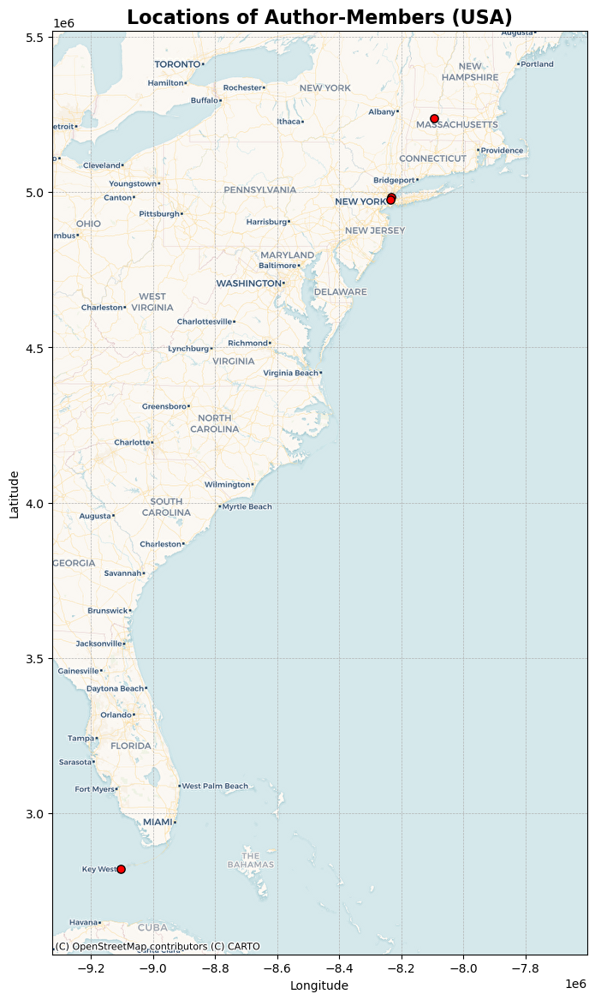

In [18]:
# Plot the world map with the USA bounds
plot_map(valid_coords_gdf, world_map_3857, usa_bounds_3857[0] + usa_bounds_3857[1], 'Locations of Author-Members (USA)', 6, map_name='locations_usa')

Now the author-members with USA locations are grouped by city using the `extract_and_group_by_city()` function.

In [19]:
# Extract and group by city for USA from the valid coordinates GeoDataFrame.
usa_grouped_initial = extract_and_group_by_city(valid_coords_gdf, usa_bounds_3857, region_name="USA")

# Create a new GeoDataFrame that includes a column counting the number of names in each group.
usa_grouped = usa_grouped_initial.assign(
    count_names=lambda df: df['sort_name'].apply(lambda x: len(x.split(', ')))
)

print("Grouped by City (Europe), ordered by number of sort_name:")
print(usa_grouped)

Grouped by City (Europe), ordered by number of sort_name:
       city                            sort_name  count_names
0    Conway                   Archibald MacLeish            1
1  Key West                     Ernest Hemingway            1
2  New York  Archibald MacLeish, Ford Madox Ford            2


The number of author-members in the USA is merely 3, but the `unique_names_by_regions()` function is still applied to extract the unique names of the author-members in the USA.

In [20]:
unique_names_by_region(usa_grouped)

List of author-members: ['Archibald MacLeish' 'Ernest Hemingway' 'Ford Madox Ford']
Total number of unique author-members: 3


For reusability purposes, the `usa_grouped` DataFrame is saved to a CSV file.

In [21]:
# Export the DataFrame to CSV
usa_grouped.to_csv(
    '../data/processed/table-data/02_AM_cities_usa.csv', # AM refers to 'Author-Member'
    index=False,
    encoding='utf-8'
)

The next step is to plot the European map with the author-members' locations.

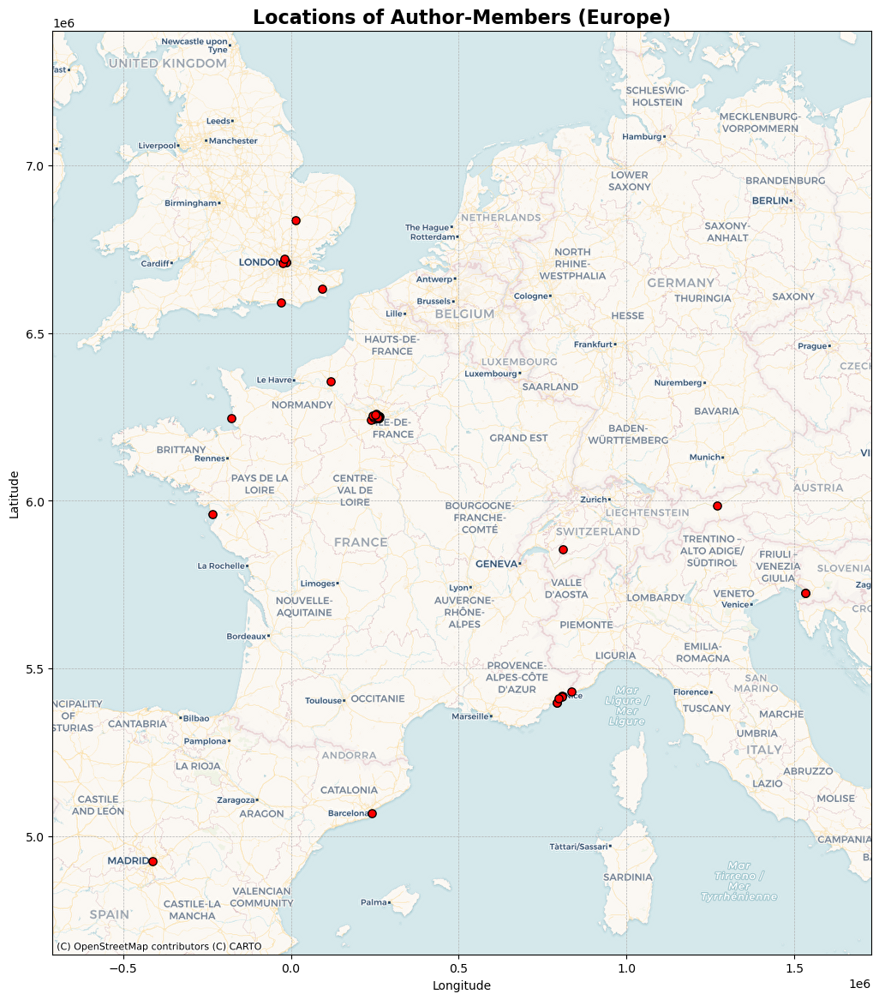

In [22]:
plot_map(valid_coords_gdf, world_map_3857, europe_bounds_3857[0] + europe_bounds_3857[1], 'Locations of Author-Members (Europe)', 6, map_name='locations_europe')

Again, the author-members are grouped by city using the `extract_and_group_by_city()` function. This time, however, a new column `count` is added to the DataFrame to count the number of author-members in each city as the map includes more author-members overall.

In [23]:
# Extract and group by city for Europe from the valid coordinates GeoDataFrame.
europe_grouped_initial = extract_and_group_by_city(valid_coords_gdf, europe_bounds_3857, region_name="Europe")

# Create a new GeoDataFrame that includes a column counting the number of names in each group.
europe_grouped_with_count = europe_grouped_initial.assign(
    count_names=lambda df: df['sort_name'].apply(lambda x: len(x.split(', ')))
)

# Create a final GeoDataFrame by sorting by the new count column in descending order.
europe_grouped = europe_grouped_with_count.sort_values('count_names', ascending=False).reset_index(drop=True)

print("Grouped by City (Europe), ordered by number of sort_name:")
print(europe_grouped)

Grouped by City (Europe), ordered by number of sort_name:
                 city                                          sort_name  \
0               Paris  André Gide, Anna Wickham, Archibald MacLeish, ...   
1              London  Anna Wickham, C. K. Ogden, Cyril Connolly, Rob...   
2   Neuilly-sur-Seine    Louis Aragon, Mary Cable Dennis, Richard Wright   
3             Antibes               Archibald MacLeish, Ernest Hemingway   
4             Trieste                      James Joyce, Stanislaus Joyce   
5                Nice                       Frank Harris, Robert McAlmon   
6              Sèvres                                       Joseph Beach   
7     Shoreham-by-Sea                                     Valery Larbaud   
8         Saint-Cloud                                 Archibald MacLeish   
9     Rueil-Malmaison                                         Ezra Pound   
10             Pornic                                     Stuart Gilbert   
11             Menton         

Again, `unique_names_by_region()` is applied to extract the unique names of the author-members in Europe.

In [24]:
unique_names_by_region(europe_grouped)

List of author-members: ['André Gide' 'Anna Wickham' 'Archibald MacLeish' 'Cyril Connolly'
 'David Gascoyne' 'Djuna Barnes' 'Douglas Goldring' 'Edwin Mims'
 'Elizabeth Clark' 'Elliot Paul' 'Ernest Hemingway' 'Eugene Jolas'
 'Ezra Pound' 'F. Scott Fitzgerald' 'Ford Madox Ford' 'George Antheil'
 'Gertrude Stein' 'Glenway Wescott' 'Grace Flandrau' 'Henri Michaux'
 'Iris Tree' 'James Boyd' 'James Joyce' 'James Stern' 'Jan Gordon'
 'Jean Schlumberger' 'John Rodker' 'John Peale Bishop' 'Jules Romains'
 'Katherine Mansfield' 'Katherine Anne Porter' 'Kathleen Coyle'
 'Konrad Bercovici' 'Leon Edel' 'Leonard Merrick' 'Louis Bromfield'
 'Louis Guilloux' 'Ludwig Lewisohn' 'Margaret Wilson'
 'Margaret C. Anderson' 'Matthew Josephson' 'Max Eastman'
 'Morley Callaghan' 'Myron Brinig' 'Natalie Clifford Barney' 'Nathan Asch'
 'Odette Keun' 'Padraic Colum' 'Pierre de Lanux' 'Richard Aldington'
 'Richard Le Gallienne' 'Robert Briffault' 'Robert McAlmon' 'Rollo Myers'
 'Romer Wilson' 'Ruth McKenney' 'Régi

For reusability purposes, the `europe_grouped` DataFrame is saved to a CSV file.

In [25]:
# Export the DataFrame to CSV
europe_grouped.to_csv(
    '../data/processed/table-data/02_AM_cities_europe.csv', # AM refers to 'Author-Member'
    index=False,
    encoding='utf-8'
)

The following code allows the search for author-member names in the `europe_grouped` DataFrame by city:

In [26]:
author_in_city = europe_grouped[europe_grouped['city'] == "London"]['sort_name'].unique()

print(author_in_city)

['Anna Wickham, C. K. Ogden, Cyril Connolly, Robert McAlmon, Samuel Beckett, Stephen Spender']


Then the locations of author-members in and around Paris are plotted.

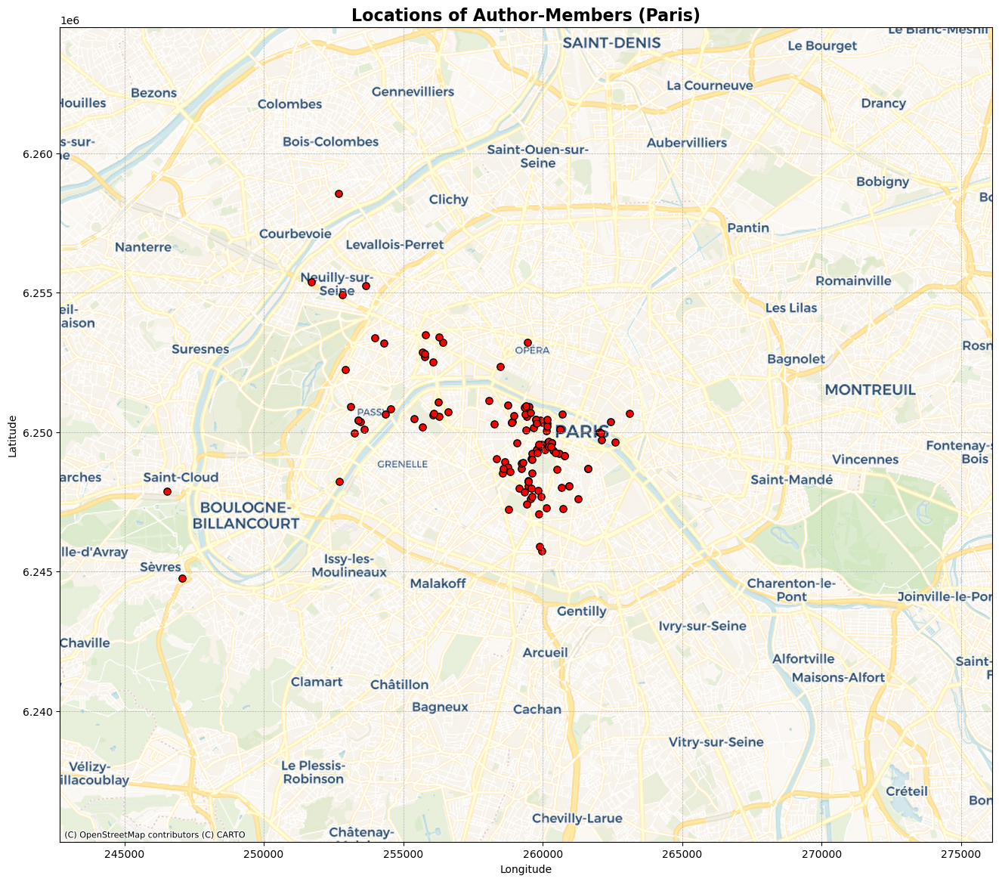

In [27]:
plot_map(valid_coords_gdf, world_map_3857, paris_bounds_3857[0] + paris_bounds_3857[1], 'Locations of Author-Members (Paris)', 12, map_name='locations_paris')

In [28]:
# Extract and group by city for Europe from the valid coordinates GeoDataFrame.
paris_grouped_initial = extract_and_group_by_city(valid_coords_gdf, paris_bounds_3857, region_name="Paris")

# Create a new GeoDataFrame that includes a column counting the number of names in each group.
paris_grouped_with_count = paris_grouped_initial.assign(
    count_names=lambda df: df['sort_name'].apply(lambda x: len(x.split(', ')))
)

# Create a final GeoDataFrame by sorting by the new count column in descending order.
paris_grouped = paris_grouped_with_count.sort_values('count_names', ascending=False).reset_index(drop=True)

print("Grouped by City (Paris), ordered by number of sort_name:")
print(paris_grouped)

Grouped by City (Paris), ordered by number of sort_name:
                city                                          sort_name  \
0              Paris  André Gide, Anna Wickham, Archibald MacLeish, ...   
1  Neuilly-sur-Seine    Louis Aragon, Mary Cable Dennis, Richard Wright   
2         Courbevoie                                     Stuart Gilbert   
3        Saint-Cloud                                 Archibald MacLeish   
4             Sèvres                                       Joseph Beach   

   count_names  
0           68  
1            3  
2            1  
3            1  
4            1  


In [29]:
unique_names_by_region(paris_grouped)

List of author-members: ['André Gide' 'Anna Wickham' 'Archibald MacLeish' 'Cyril Connolly'
 'David Gascoyne' 'Djuna Barnes' 'Douglas Goldring' 'Edwin Mims'
 'Elizabeth Clark' 'Elliot Paul' 'Ernest Hemingway' 'Eugene Jolas'
 'Ezra Pound' 'F. Scott Fitzgerald' 'Ford Madox Ford' 'George Antheil'
 'Gertrude Stein' 'Glenway Wescott' 'Grace Flandrau' 'Henri Michaux'
 'Iris Tree' 'James Boyd' 'James Joyce' 'James Stern' 'Jan Gordon'
 'Jean Schlumberger' 'John Rodker' 'John Peale Bishop' 'Jules Romains'
 'Katherine Mansfield' 'Katherine Anne Porter' 'Kathleen Coyle'
 'Konrad Bercovici' 'Leon Edel' 'Leonard Merrick' 'Louis Bromfield'
 'Ludwig Lewisohn' 'Margaret Wilson' 'Margaret C. Anderson'
 'Matthew Josephson' 'Max Eastman' 'Morley Callaghan' 'Myron Brinig'
 'Natalie Clifford Barney' 'Nathan Asch' 'Odette Keun' 'Padraic Colum'
 'Pierre de Lanux' 'Richard Aldington' 'Richard Le Gallienne'
 'Robert Briffault' 'Robert McAlmon' 'Rollo Myers' 'Romer Wilson'
 'Ruth McKenney' 'Régis Michaud' 'Samue

For reusability purposes, the `paris_grouped` DataFrame is saved to a CSV file.

In [30]:
# Export the DataFrame to CSV
paris_grouped.to_csv(
    '../data/processed/table-data/02_AM_cities_paris.csv', # AM refers to 'Author-Member'
    index=False,
    encoding='utf-8'
)

### Shared Addresses Among Author-Members

The following code extracts the shared addresses of the author-members by grouping and aggregating the `valid_coords_gdf` DataFrame.

Definiton: The shared addresses are the addresses where multiple author-members lived.

In [31]:
# Perform grouping and aggregation, preserving the geometry
grouped_df = valid_coords_gdf.groupby('geometry').agg(
    latitude=('latitude', 'first'),  # Keep the first latitude for each geometry
    longitude=('longitude', 'first'),  # Keep the first longitude for each geometry
    names=('sort_name', lambda x: sort_names(sorted(x))),
    count=('sort_name', 'size'),  # Count the number of names per address
    address=('address', 'first'),  # Keep the first address for each geometry
).reset_index()

# Convert back to GeoDataFrame (geometry is already included in the grouping key)
grouped_gdf = gpd.GeoDataFrame(grouped_df, geometry='geometry', crs=valid_coords_gdf.crs)

# Filter only the shared addresses (count > 1)
filtered_grouped_gdf = grouped_gdf[grouped_gdf['count'] > 1]

print(filtered_grouped_gdf)

# Filter based on x-coordinate, only keep rows where x-coordinate <= 280,000 (to only include Parisian addresses)
shared_addresses = filtered_grouped_gdf[filtered_grouped_gdf.geometry.apply(
    lambda x: x.is_empty or (x.x <= 280000 if x.geom_type == 'Point' else True)
)].reset_index(drop=True)

# Check the result
print(shared_addresses)

                            geometry  latitude  longitude  \
22    POINT (261626.407 6248693.287)  48.84554    2.35023   
36    POINT (260936.226 6248067.437)  48.84184    2.34403   
60    POINT (253392.104 6250440.840)  48.85587    2.27626   
94    POINT (258881.268 6250339.327)  48.85527    2.32557   
98    POINT (259745.107 6250456.067)  48.85596    2.33333   
121   POINT (260315.063 6249603.391)  48.85092    2.33845   
128   POINT (260787.058 6249168.627)  48.84835    2.34269   
137  POINT (1533761.057 5724757.872)  45.65201   13.77801   

                                                 names  count  \
22                         James Joyce, Valery Larbaud      2   
36                    Samuel Beckett, Thomas MacGreevy      2   
60                        James Joyce, Pierre de Lanux      2   
94              Margaret Wilson, Stephen Vincent Benét      2   
98                    David Gascoyne, Ernest Hemingway      2   
121  George Antheil, Padraic Colum, Robert McAlmon,...      

The `filtered_grouped_gdf` GeoDataFrame contains all shared addresses of the author-members and is saved to a CSV file for reusability purposes.

In [32]:
# Export the DataFrame to CSV.
filtered_grouped_gdf.to_csv(
    '../data/processed/table-data/02_AM_locations_shared.csv', # AM refers to 'Author-Member'
    index=False,
    encoding='utf-8'
)

The `shared_addresses` GeoDataFrame contains the shared Paris addresses of the author-members and is saved to a CSV file for reusability purposes.

In [33]:
# Export the DataFrame to CSV.
shared_addresses.to_csv(
    '../data/processed/table-data/02_AM_locations_paris_shared.csv', # AM refers to 'Author-Member'
    index=False,
    encoding='utf-8'
)

The `shared_addresses` GeoDataFrame is plotted on a map to visualize the shared Paris addresses of the author-members.

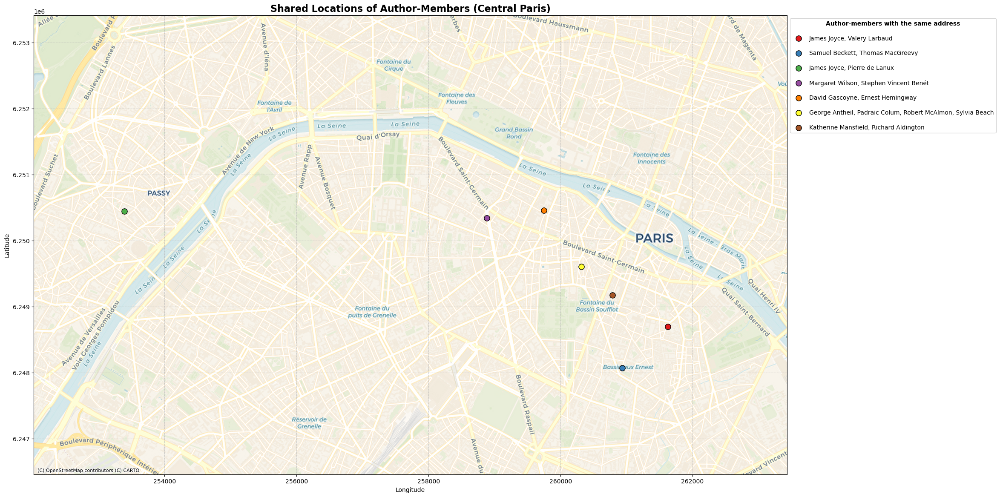

In [35]:
# Plot the map with legend
plot_map(shared_addresses, world_map_3857, paris_central_bounds_3857[0] + paris_central_bounds_3857[1], title='Shared Locations of Author-Members (Central Paris)', zoom=14, name_col='names', map_name='locations_paris_shared')